In [2]:
import imp
import os
import logging

import pandas as pd
import plotly.graph_objects as go
import plotly.express as px
import plotly
import statsmodels

from BuildingControlsSimulator.Simulator.Simulator import Simulator
from BuildingControlsSimulator.Simulator.Config import Config
from BuildingControlsSimulator.BuildingModels.IDFPreprocessor import IDFPreprocessor
from BuildingControlsSimulator.BuildingModels.EnergyPlusBuildingModel import EnergyPlusBuildingModel
from BuildingControlsSimulator.ControlModels.Deadband import Deadband

from BuildingControlsSimulator.DataClients.DataClient import DataClient
from BuildingControlsSimulator.DataClients.GCSDYDSource import GCSDYDSource
from BuildingControlsSimulator.OutputAnalysis.OutputAnalysis import OutputAnalysis


plotly.offline.init_notebook_mode(connected=True)
%load_ext autoreload
%autoreload 2


In [3]:
dc = DataClient(
            source=GCSDYDSource(
                gcp_project=os.environ.get("GOOGLE_CLOUD_PROJECT"),
                gcs_uri_base=os.environ.get("DYD_GCS_URI_BASE"),
            ),
            nrel_dev_api_key=os.environ.get("NREL_DEV_API_KEY"),
            nrel_dev_email=os.environ.get("NREL_DEV_EMAIL"),
            meta_gs_uri=os.environ.get("DYD_METADATA_URI"),
            archive_tmy3_meta=os.environ.get("ARCHIVE_TMY3_META"),
            archive_tmy3_data_dir=os.environ.get("ARCHIVE_TMY3_DATA_DIR"),
            ep_tmy3_cache_dir=os.environ.get("EP_TMY3_CACHE_DIR"),
            simulation_epw_dir=os.environ.get("SIMULATION_EPW_DIR"),
        )

In [4]:
sim_config = Config.make_sim_config(
    identifier=[
        "2df6959cdf502c23f04f3155758d7b678af0c631",  # has full data periods
    ],
    latitude=33.481136,
    longitude=-112.078232,
    start_utc="2018-05-16",
    end_utc="2018-06-01",
    min_sim_period="14D",
    min_chunk_period="30D",
    step_size_minutes=5,
)

In [5]:
%%time
master = Simulator(
    data_client=dc,
    sim_config=sim_config,
    building_models=[
        EnergyPlusBuildingModel(
            idf=IDFPreprocessor(idf_file="AZ_Phoenix_gasfurnace_crawlspace_IECC_2018_cycles.idf",),
        )
    ],
    controller_models=[Deadband(deadband=1.0),],
)


CPU times: user 2.28 s, sys: 41 ms, total: 2.32 s
Wall time: 2.33 s


In [6]:
%%time
# simulate
master.simulate(local=True, preprocess_check=True)

CPU times: user 11.3 s, sys: 770 ms, total: 12 s
Wall time: 52.2 s


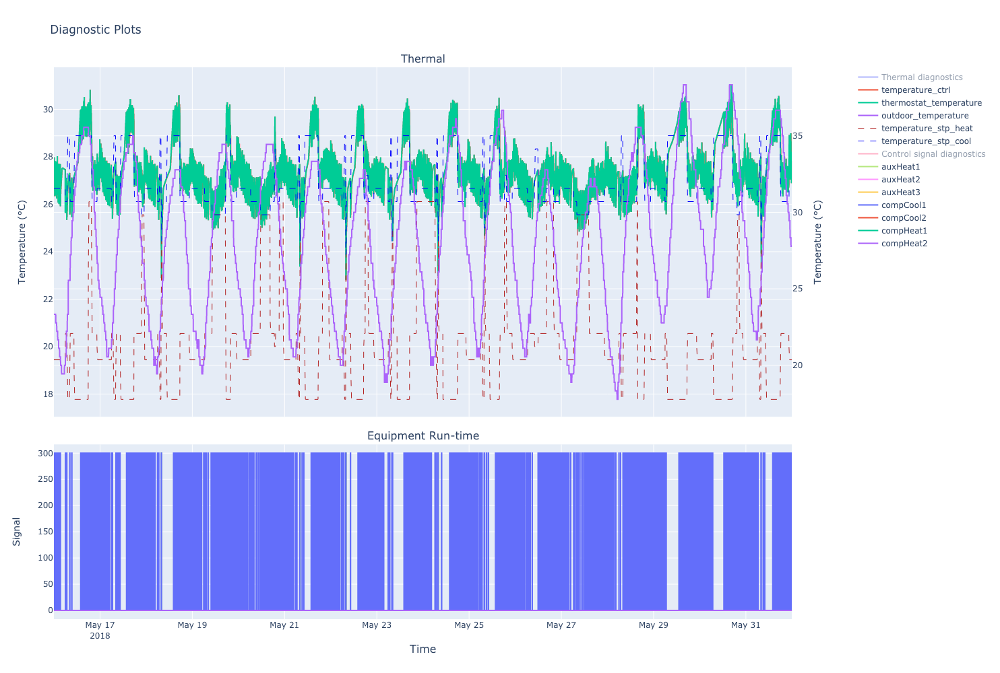

In [23]:
sim_analysis = OutputAnalysis(output_df=master.simulations[0].output, input_df=master.simulations[0].full_input)
sim_analysis.diagnostic_plot(show=True)

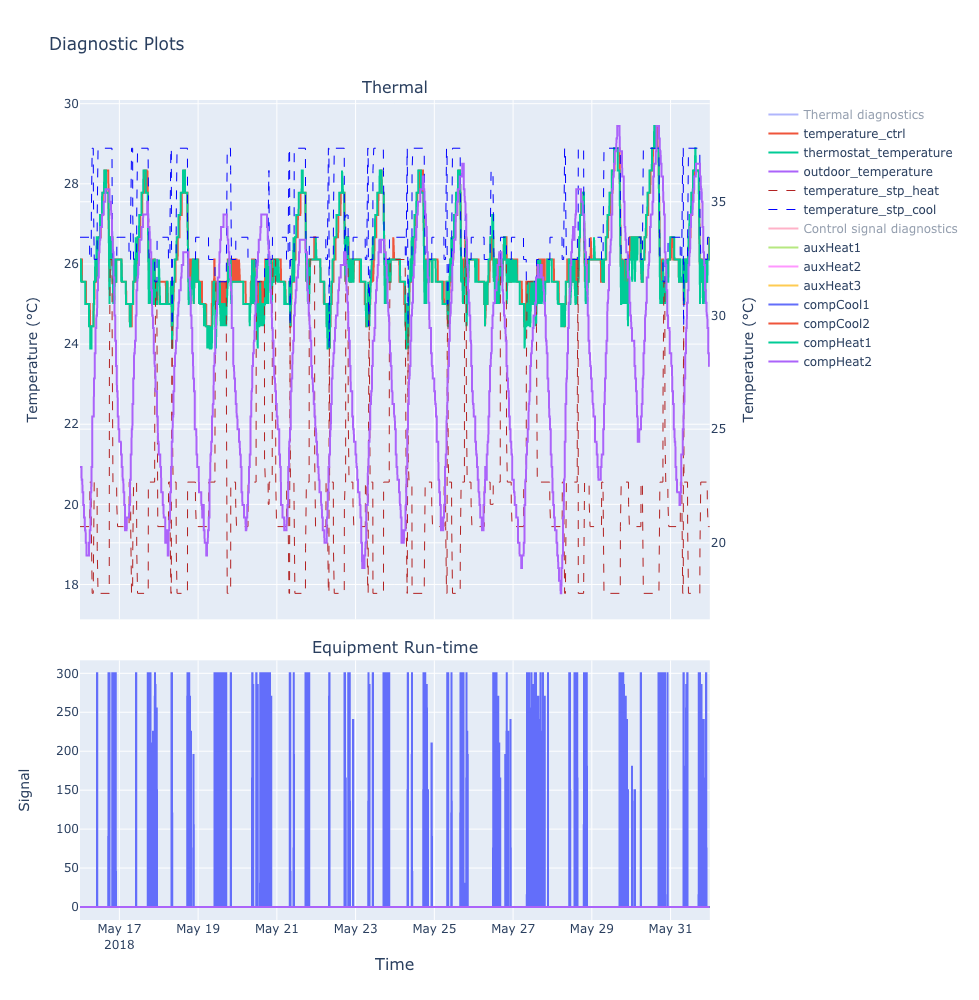

In [25]:
actual_analysis = OutputAnalysis(output_df=master.simulations[0].full_input, input_df=master.simulations[0].full_input)
actual_analysis.diagnostic_plot(show=True)